# scEU-seq cell cycle

This tutorial uses the cell cycle dataset from [Battich, et al (2020)](https://science.sciencemag.org/content/367/6482/1151). This tutorial is the first one of the two tutorials for demonstrating how dynamo can use used to analyze the scEU-seq data. Please refer the [organoid](https://dynamo-release.readthedocs.io/en/latest/scEU_seq_organoid_analysis_kinetic.html) tutorial for details on how to analyze the organoid dataset. 

Recently Battich and colleague reported scEU-seq as a method to sequence mRNA labeled with 5-ethynyl-uridine (EU) in single cells. By developing a very creative labeling strategy (personally this is my favorite labeling strategy from all available labeling based scRNA-seq papers!) they are able to estimate of RNA transcription and degradation rates in single cell across time. 

They applied scEU-seq and the labeling strategy to study the transcription and degradation rates for both the cell cycle and differentiation processes. Similar to what has been discovered in bulk studies, they find the transcription rates are highly dynamic while the degration rate tend to be more stable across different time points. Furthermore, by quantifying the correlation between the transcription rate and degration rates across time, they reveal major regulatory strategies which have distinct consequences for controlling the dynamic range and precision of gene expression. 

For both of the cell cycle and the organoid systems, the authors use kinetics and a mixture of pulse and chase experiment to label the cells. I had a lot fun to analyze this complicate dataset. But for the sake of simplicity, here I am going to only use the fraction of kinetics experiment for demonstrating how dynamo can be used to estimate labeling based RNA velocity and to reconstruct vector field function. 

In [2]:
import warnings
warnings.filterwarnings('ignore')

import dynamo as dyn
import anndata
import pandas as pd
import numpy as np
import scipy.sparse

from anndata import AnnData
from scipy.sparse import csr_matrix

dyn.configuration.set_figure_params('dynamo', background='white')
dyn.get_all_dependencies_version()

package,umap-learn,typing-extensions,tqdm,statsmodels,setuptools,session-info,seaborn,scipy,pynndescent,pre-commit,pandas,openpyxl,numdifftools,numba,networkx,matplotlib,loompy,leidenalg,igraph,get-version,dynamo-release,colorcet,anndata
version,0.5.6,4.11.0,4.66.2,0.14.2,69.5.1,1.0.0,0.13.2,1.11.4,0.5.12,3.7.1,1.5.3,3.1.4,0.9.41,0.58.1,3.3,3.9.2,3.0.7,0.10.2,0.10.8,3.5.5,1.4.2rc1,3.1.0,0.10.7


## Load data 
Let us first take a look at number of cells collected at labeling time point for either the pulse or chase experiment. 

In [5]:
rpe1 = dyn.sample_data.scEU_seq_rpe1()

|-----> Downloading scEU_seq data
|-----> Downloading data to ./data/rpe1.h5ad
|-----> File ./data/rpe1.h5ad already exists.


In [6]:
dyn.convert2float(rpe1, ['Cell_cycle_possition', 'Cell_cycle_relativePos'])

In [7]:
rpe1

AnnData object with n_obs × n_vars = 5422 × 11848
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time'
    var: 'Gene_Id'
    layers: 'sl', 'su', 'ul', 'uu'

In [8]:
rpe1.obs.exp_type.value_counts()

Pulse    3058
Chase    2364
Name: exp_type, dtype: int64

In [9]:
rpe1[rpe1.obs.exp_type=='Chase', :].obs.time.value_counts()

120     541
0       460
60      436
240     391
360     334
dmso    202
Name: time, dtype: int64

In [10]:
rpe1[rpe1.obs.exp_type=='Pulse', :].obs.time.value_counts()

30      574
45      564
15      442
120     408
60      405
180     400
dmso    265
Name: time, dtype: int64

## Subset the kinetics experimetn data 

For the sake of simplicity, I am going to just focus on the kinetics experiment dataset analysis.

In [11]:
rpe1_kinetics = rpe1[rpe1.obs.exp_type=='Pulse', :]
rpe1_kinetics.obs['time'] = rpe1_kinetics.obs['time'].astype(str)
rpe1_kinetics.obs.loc[rpe1_kinetics.obs['time'] == 'dmso', 'time'] = -1
rpe1_kinetics.obs['time'] = rpe1_kinetics.obs['time'].astype(float)
rpe1_kinetics = rpe1_kinetics[rpe1_kinetics.obs.time != -1, :]

rpe1_kinetics.layers['new'], rpe1_kinetics.layers['total'] = rpe1_kinetics.layers['ul'] + rpe1_kinetics.layers['sl'], rpe1_kinetics.layers['su'] + rpe1_kinetics.layers['sl'] + rpe1_kinetics.layers['uu'] + rpe1_kinetics.layers['ul']

del rpe1_kinetics.layers['uu'], rpe1_kinetics.layers['ul'], rpe1_kinetics.layers['su'], rpe1_kinetics.layers['sl']


In [12]:
rpe1_kinetics

AnnData object with n_obs × n_vars = 2793 × 11848
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time'
    var: 'Gene_Id'
    layers: 'new', 'total'

## Perform a typical dynamo analysis

A typical analysis in dynamo includes:

    1. the preprocessing procedure; 
    2. kinetic estimation and velocity calculation;
    3. dimension reduction;
    4. high dimension velocity projection;
    5. vector field reconstruction 
    
Note that in the preprocess stages, we calculate some basic statistics, the number of genes, total UMI counts and percentage of mitochondrian UMIs in each cell so we can visualize them via `dyn.pl.basic_stats`. Moreover, if the `adata.var_name` is not official gene names but ensemble gene ids, dynamo will try to automatically convert those gene ids into more readable official gene names. 

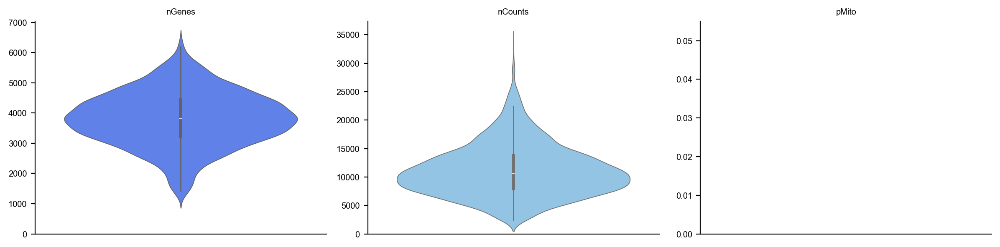

In [13]:
dyn.pl.basic_stats(rpe1_kinetics)

In [14]:
rpe1_genes = ['UNG', 'PCNA', 'PLK1', 'HPRT1']

In [15]:
rpe1_kinetics.obs.time

Cell_02365     15.0
Cell_02366     30.0
Cell_02367     30.0
Cell_02368     30.0
Cell_02369     45.0
              ...  
Cell_05418    120.0
Cell_05419    120.0
Cell_05420    180.0
Cell_05421    180.0
Cell_05422    180.0
Name: time, Length: 2793, dtype: float64

In [16]:
rpe1_kinetics.obs.time  = rpe1_kinetics.obs.time.astype('float')
rpe1_kinetics.obs.time = rpe1_kinetics.obs.time/60 # convert minutes to hours 


In [17]:
rpe1_kinetics.obs.time.value_counts()

0.50    574
0.75    564
0.25    442
2.00    408
1.00    405
3.00    400
Name: time, dtype: int64

## Estimate time-resolved RNA velocity 
There are some very non-trivial consideration between estimating time-resolved RNA velocity and estimating transcription/degration kinetics rates. The following code provides the right strategy for time-resolved RNA velocity analysis. Wait for our final publication for more in-depth discussion in this interesting topic!

In [18]:
dyn.tl.recipe_kin_data(adata=rpe1_kinetics,
                       keep_filtered_genes=True,
                       keep_raw_layers=True,
                       del_2nd_moments=False,
                       tkey='time',
                      )

|-----> keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: keep_filtered_cells_key=False
|-----> Running monocle preprocessing pipeline...
|-----> convert ensemble name to official gene name
|-----? Your adata object uses non-official gene names as gene index. 
Dynamo is converting those names to official gene names.
|-----> Storing myGene name info into local cache db: mygene_cache.sqlite.


1 input query terms found dup hits:	[('ENSG00000249738', 2)]
52 input query terms found no hit:	['ENSG00000112096', 'ENSG00000116957', 'ENSG00000130723', 'ENSG00000168078', 'ENSG00000189144', 'ENS


|-----> Subsetting adata object and removing Nan columns from adata when converting gene names.
|-----------> filtered out 0 outlier cells
|-----------> filtered out 944 outlier genes
|-----> PCA dimension reduction
|-----> <insert> X_pca to obsm in AnnData Object.
|-----> computing cell phase...
|-----> [Cell Phase Estimation] completed [298.7816s]
|-----> [Cell Cycle Scores Estimation] completed [0.4040s]
|-----> [Preprocessor-monocle] completed [47.8045s]
|-----------> removing existing M layers:[]...
|-----------> making adata smooth...
|-----> calculating first/second moments...
|-----> [moments calculation] completed [22.4666s]
|-----? Your adata only has labeling data, but `NTR_vel` is set to be `False`. Dynamo will reset it to `True` to enable this analysis.
|-----> experiment type: kin, method: twostep, model: deterministic


Estimate gamma via linear regression of t vs. -ln(1-K): 1000it [00:05, 190.64it/s]


|-----> retrieve data for non-linear dimension reduction...
|-----> [UMAP] using X_pca with n_pca_components = 30
|-----> <insert> X_umap to obsm in AnnData Object.
|-----> [UMAP] completed [21.7031s]
|-----> incomplete neighbor graph info detected: connectivities and distances do not exist in adata.obsp, indices not in adata.uns.neighbors.
|-----> Neighbor graph is broken, recomputing....
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%|-----> [calculating transition matrix via pearson kernel with sqrt transform.] completed [2.7124s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%|-----> [projecting velocity vector to low dimensional embedding]

AnnData object with n_obs × n_vars = 2793 × 11511
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'Size_Factor', 'initial_cell_size', 'new_Size_Factor', 'initial_new_cell_size', 'total_Size_Factor', 'initial_total_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Gene_Id', 'nCells', 'nCounts', 'query', 'scopes', '_id', '_score', 'symbol', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'frac', 'use_for_pca', 'ntr', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'feature_selection', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'cell_phase_order', 'cell_phase_genes', 'vel_params_names', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'cell_cycle_scores', 'X_umap', 'velocity_umap'
    varm: 'vel_params'
    layers: 'new', 'total', 'X_new', 'X_total', 'M_t', 'M_tt', 'M_n

In [19]:
rpe1_kinetics

AnnData object with n_obs × n_vars = 2793 × 11511
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'Size_Factor', 'initial_cell_size', 'new_Size_Factor', 'initial_new_cell_size', 'total_Size_Factor', 'initial_total_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Gene_Id', 'nCells', 'nCounts', 'query', 'scopes', '_id', '_score', 'symbol', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'frac', 'use_for_pca', 'ntr', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'feature_selection', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'cell_phase_order', 'cell_phase_genes', 'vel_params_names', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'cell_cycle_scores', 'X_umap', 'velocity_umap'
    varm: 'vel_params'
    layers: 'new', 'total', 'X_new', 'X_total', 'M_t', 'M_tt', 'M_n

## Visualize velocity streamlines 

When we project our estimated transcriptomic RNA velocity to the space formed by the $log_{10}(fluorescence), Geminin -GFP$ and $log_{10}(fluorescence), Cdt1-RFP$ (Geminin and Cdt1 are two markers of different cell cycle stages), we can a nice transition from early cell cycle stage to late cell cycle stage. 

|-----> retrieve data for non-linear dimension reduction...
|-----? adata already have basis umap. dimension reduction umap will be skipped! 
set enforce=True to re-performing dimension reduction.
|-----> [UMAP] completed [0.0015s]
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%|-----> [calculating transition matrix via pearson kernel with sqrt transform.] completed [2.9264s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%|-----> [projecting velocity vector to low dimensional embedding] completed [1.1183s]
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----------> plotting with basis key=X_RFP_GFP
|-----------> plotting with basis key=X_RFP_GFP


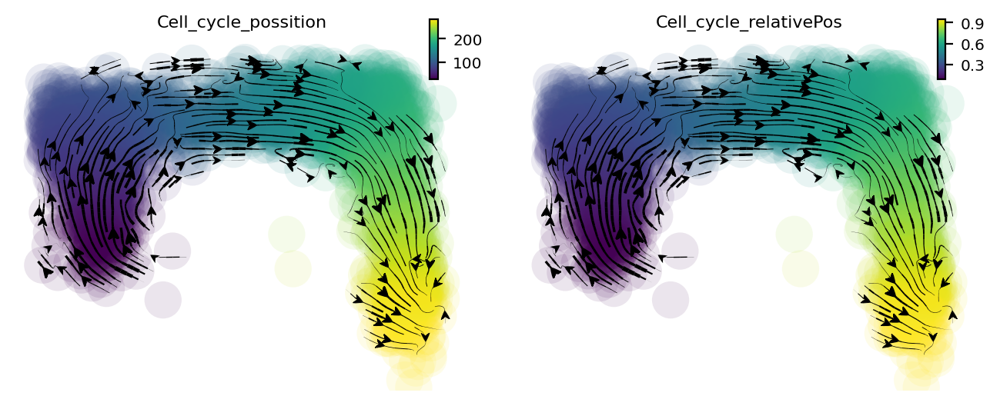

AnnData object with n_obs × n_vars = 2793 × 11511
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'Size_Factor', 'initial_cell_size', 'new_Size_Factor', 'initial_new_cell_size', 'total_Size_Factor', 'initial_total_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Gene_Id', 'nCells', 'nCounts', 'query', 'scopes', '_id', '_score', 'symbol', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'frac', 'use_for_pca', 'ntr', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'feature_selection', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'cell_phase_order', 'cell_phase_genes', 'vel_params_names', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'grid_velocity_RFP_GFP'
    obsm: 'X_pca', 'cell_cycle_scores', 'X_umap', 'velocity_umap', 'X_RFP_GFP', 'velocity_RFP_GFP'
    varm: 'vel_params'
    layer

In [20]:
def streamline(adata):
    dyn.tl.reduceDimension(adata, reduction_method='umap')
    dyn.tl.cell_velocities(adata, enforce=True, vkey='velocity_T', ekey='M_t', basis='RFP_GFP')
    dyn.pl.streamline_plot(adata, color=['Cell_cycle_possition', 'Cell_cycle_relativePos'], 
                           basis='RFP_GFP',figsize=(4,3))

    return adata

rpe1_kinetics.obsm['X_RFP_GFP'] = rpe1_kinetics.obs.loc[:, ['RFP_log10_corrected', 'GFP_log10_corrected']].values.astype('float')
streamline(rpe1_kinetics)

Since dynamo automatically performs the cell cycle staging at the preprocess step with cell-cycle related marker genes using methods from [Norman et. al](https://science.sciencemag.org/content/365/6455/786). We can also check whether dynamo's staging makes any sense for this dataset. Interesting, dynamo staging indeed reveals a nice transition from M stage to M-G, to G1-S, to S and finally to G2-M stage. This is awesome! 

|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----------> plotting with basis key=X_RFP_GFP
|-----------> skip filtering cell_cycle_phase by stack threshold when stacking color because it is not a numeric type


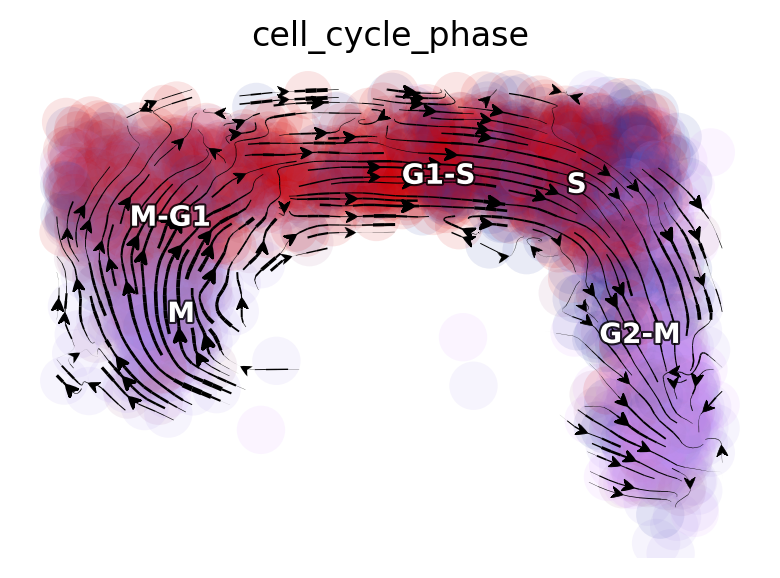

In [21]:
dyn.pl.streamline_plot(rpe1_kinetics, color=['cell_cycle_phase'], 
                       basis='RFP_GFP',figsize=(4,3))


## Animate cell cycle transition

In [22]:
dyn.vf.VectorField(rpe1_kinetics, basis='RFP_GFP', map_topography=True, M=50)


|-----> VectorField reconstruction begins...
|-----> Retrieve X and V based on basis: RFP_GFP. 
        Vector field will be learned in the RFP_GFP space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> [SparseVFC] completed [0.0683s]
|-----------> current cosine correlation between input velocities and learned velocities is less than 0.6. Make a 1-th vector field reconstruction trial.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] completed [0.0609s]
|-----------> current cosine correlation between input velocities and learned velocities is less than 0.6. Make a 2-th vector field reconstruction trial.
|-----> [SparseVFC] begins...
|---

In [23]:
progenitor = rpe1_kinetics.obs_names[rpe1_kinetics.obs.Cell_cycle_relativePos < 0.1]
len(progenitor)

78

In [24]:
np.random.seed(19491001)

from matplotlib import animation
info_genes = rpe1_kinetics.var_names[rpe1_kinetics.var.use_for_transition]
dyn.pd.fate(rpe1_kinetics, basis='RFP_GFP', init_cells=progenitor, interpolation_num=100,  direction='forward',
   inverse_transform=False, average=False)


uniformly sampling points along a trajectory: 100%|██████████| 78/78 [00:00<00:00, 796.56it/s]


AnnData object with n_obs × n_vars = 2793 × 11511
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'Size_Factor', 'initial_cell_size', 'new_Size_Factor', 'initial_new_cell_size', 'total_Size_Factor', 'initial_total_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_RFP_GFP', 'inlier_prob_RFP_GFP', 'obs_vf_angle_RFP_GFP'
    var: 'Gene_Id', 'nCells', 'nCounts', 'query', 'scopes', '_id', '_score', 'symbol', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'frac', 'use_for_pca', 'ntr', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'feature_selection', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'cell_phase_order', 'cell_phase_genes', 'vel_params_names', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'grid_velocity_RFP_GFP', 'cell_cycle_phase_colors', 'VecFld_RFP_GFP', 'fate_RFP_GFP

|-----------> plotting with basis key=X_RFP_GFP


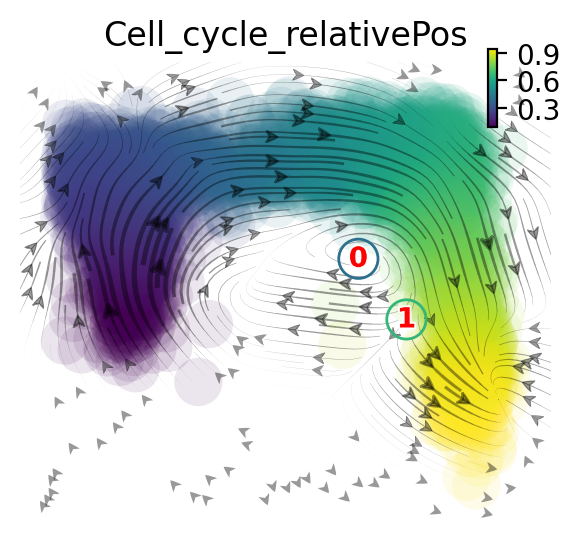

In [28]:
import matplotlib.pyplot as plt 

fig, ax = plt.subplots(figsize=(4,3))
ax = dyn.pl.topography(rpe1_kinetics, basis='RFP_GFP',
                       color='Cell_cycle_relativePos', ax=ax, 
                       save_show_or_return='return', fps_basis='RFP_GFP')
ax.set_aspect(0.8)
fig


In [29]:
%%capture
instance = dyn.mv.StreamFuncAnim(adata=rpe1_kinetics, basis='RFP_GFP', 
                                 color='Cell_cycle_relativePos', ax=ax, fig=fig)

|-----? the number of cell states with fate prediction is more than 50. You may want to lower the max number of cell states to draw via cell_states argument.


In [30]:
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**64 # Ensure all frames will be embedded.

from matplotlib import animation
import numpy as np

anim = animation.FuncAnimation(instance.fig, instance.update, init_func=instance.init_background,
                               frames=np.arange(100), interval=100, blit=True)
from IPython.core.display import display, HTML
HTML(anim.to_jshtml()) # embedding to jupyter notebook.